In [2]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from IPython.display import Audio

%matplotlib inline

In [3]:
y, sr = librosa.load("../datasets/ontario.mp3")
print(f"Shape: {y.shape}")
print(f"Sample Rate: {sr}")
print(f"chroma FPS: {len(y) / sr}")

Shape: (3293408,)
Sample Rate: 22050
chroma FPS: 149.36090702947845


In [4]:
Audio(y, rate=sr)

# Default (STFT)

In [5]:
S = np.abs(librosa.stft(y))
hop_length = int(sr * 0.1) # per 100 ms
chroma = librosa.feature.chroma_stft(y=y, sr=sr, hop_length=hop_length)
print(chroma.shape)

(12, 1494)


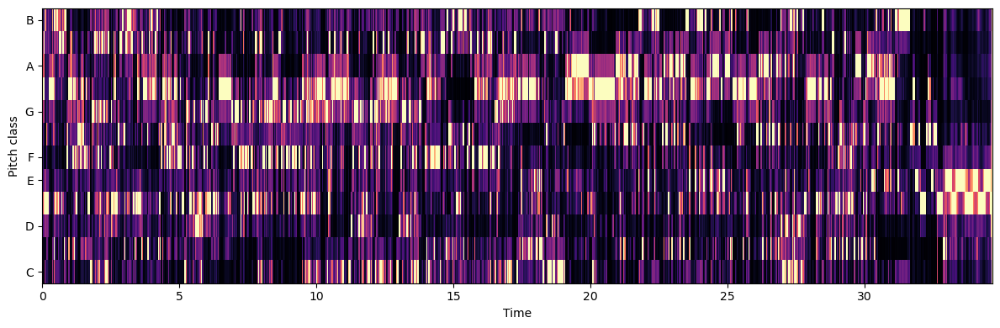

In [6]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(chroma, y_axis="chroma", x_axis="time")
plt.tight_layout()

# Enhanced (Q-Constant)
https://librosa.org/doc/main/auto_examples/plot_chroma.html#enhanced-chroma

## 1. Harmonics

In [11]:
y_harm = librosa.effects.harmonic(y=y, margin=8)
#chroma_harm = librosa.feature.chroma_cqt(y=y_harm, sr=sr, hop_length=hop_length)
chroma_harm = librosa.feature.chroma_stft(y=y_harm, sr=sr, hop_length=hop_length)

In [8]:
Audio(data=y_harm, rate=sr)

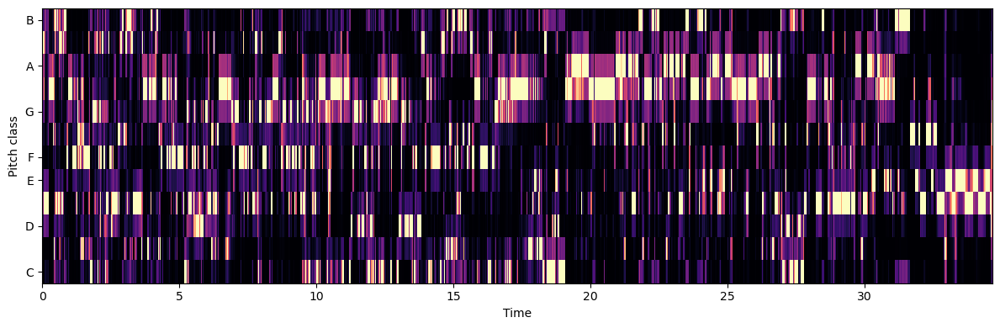

In [12]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(chroma_harm, y_axis="chroma", x_axis="time")
plt.tight_layout()

## 2. Non local filtering

In [10]:
chroma_filter = np.minimum(
    chroma_harm,
    librosa.decompose.nn_filter(chroma_harm, aggregate=np.median)
)

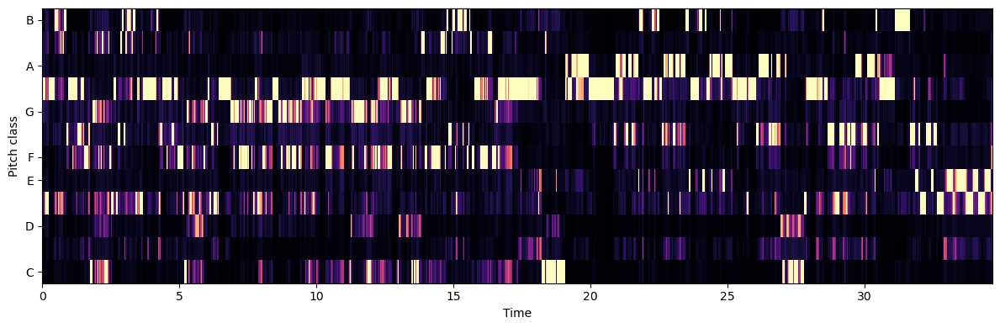

In [11]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(chroma_filter, y_axis="chroma", x_axis="time")
plt.tight_layout()

## 3. Smoothing

In [12]:
chroma_smooth = scipy.ndimage.median_filter(chroma_filter, size=(1, 9))

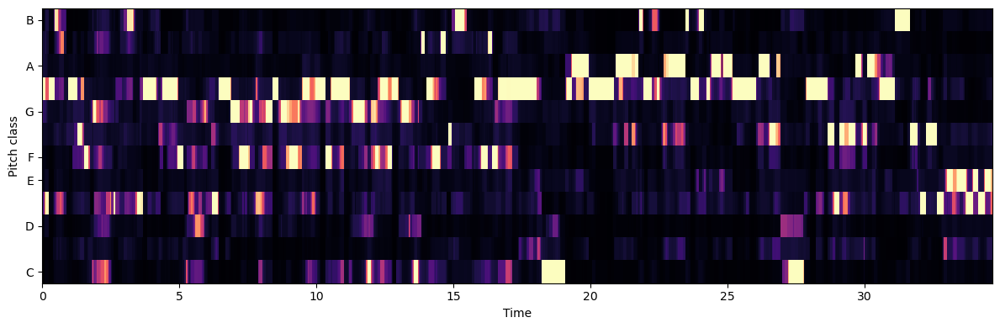

In [13]:
plt.figure(figsize=(12, 4))
librosa.display.specshow(chroma_smooth, y_axis="chroma", x_axis="time")
plt.tight_layout()

# Dataset

In [13]:
# df = pd.lo